# AIES ANN Project

# Salar Hosseiny Shamchi 9805884

## Part 1 with EfficientDet D0

#### Mount Google Drive

In [1]:
from google.colab import drive

drive.mount('/content/gdrive')

Mounted at /content/gdrive


#### Clone TensorFlow models to use its object detection API

In [2]:
import os
import pathlib

# Clone the tensorflow models repository if it doesn't already exist
if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 2689, done.
remote: Counting objects: 100% (2689/2689), done.
remote: Compressing objects: 100% (2236/2236), done.
remote: Total 2689 (delta 681), reused 1244 (delta 420), pack-reused 0
Receiving objects: 100% (2689/2689), 32.67 MiB | 35.21 MiB/s, done.
Resolving deltas: 100% (681/681), done.


#### Install the necessary packages for TensorFlow object detection API

In [3]:
%cd models/research/
!protoc object_detection/protos/*.proto --python_out=.
!cp object_detection/packages/tf2/setup.py .
!python -m pip install .

/content/models/research
Processing /content/models/research
     |████████████████████████████████| 9.6MB 42.7MB/s 
     |████████████████████████████████| 358kB 45.4MB/s 
     |████████████████████████████████| 1.6MB 55.5MB/s 
     |████████████████████████████████| 153kB 56.9MB/s 
     |████████████████████████████████| 2.3MB 53.8MB/s 
     |████████████████████████████████| 61kB 6.7MB/s 
     |████████████████████████████████| 829kB 47.6MB/s 
     |████████████████████████████████| 686kB 50.3MB/s 
     |████████████████████████████████| 1.2MB 42.2MB/s 
     |████████████████████████████████| 51kB 7.9MB/s 
     |████████████████████████████████| 174kB 34.6MB/s 
     |████████████████████████████████| 645kB 48.1MB/s 
     |████████████████████████████████| 38.2MB 79kB/s 
     |████████████████████████████████| 102kB 12.9MB/s 
     |████████████████████████████████| 61kB 8.5MB/s 
  Created wheel for object-detection: filename=object_detection-0.1-cp37-none-any.whl size=1652710 sha256=

#### Unzip the dataset

In [4]:
!unrar x /content/gdrive/MyDrive/ANN.rar /content/


UNRAR 5.50 freeware      Copyright (c) 1993-2017 Alexander Roshal


Extracting from /content/gdrive/MyDrive/ANN.rar

Creating    /content/annotations                                      OK
Extracting  /content/annotations/maksssksksss0.xml                         0%  OK 
Extracting  /content/annotations/maksssksksss1.xml                         0%  OK 
Extracting  /content/annotations/maksssksksss10.xml                        0%  OK 
Extracting  /content/annotations/maksssksksss100.xml                       0%  OK 
Extracting  /content/annotations/maksssksksss101.xml                       0%  OK 
Extracting  /content/annotations/maksssksksss102.xml                       0%  OK 
Extracting  /content/annotations/maksssksksss103.xml                       0%  OK 
Extracting  /content/annotations/maksssksksss104.xml                       0%  OK 
Extracting  /content/annotations/maksssksksss105.xml                     

#### Create a csv file containing dataset details

In [ ]:
import json
import os
import glob
import pandas as pd
import argparse
import xml.etree.ElementTree as ET
from tqdm import tqdm



def __list_to_csv(annotations, output_file):
   column_name = ['filename', 'width', 'height', 'class', 'xmin', 'ymin', 'xmax', 'ymax']
   xml_df = pd.DataFrame(annotations, columns=column_name)
   xml_df.to_csv(output_file, index=None)


def xml_to_csv(xml_dir, img_dir, output_file):
   """Reads all XML files, generated by labelImg, from a directory and generates a single CSV file"""
   annotations = []
   # Correction in class names
   for xml_file in tqdm(glob.glob(xml_dir + '/*.xml')):
      tree = ET.parse(xml_file)
      root = tree.getroot()
      for member in root.findall('object'):
          if member.find('name').text == 'mask_weared_incorrect':
              member.find('name').text = 'mask_worn_incorrectly'
      tree.write(xml_file)
   for xml_file in tqdm(glob.glob(xml_dir + '/*.xml')):
      tree = ET.parse(xml_file)
      root = tree.getroot()
      for member in root.findall('object'):
         value = (img_dir + root.find('filename').text,
                  int(root.find('size')[0].text),
                  int(root.find('size')[1].text),
                  member[0].text,
                  int(member[5][0].text),
                  int(member[5][1].text),
                  int(member[5][2].text),
                  int(member[5][3].text))
         annotations.append(value)

   __list_to_csv(annotations, output_file)


def json_to_csv(input_json, output_file):
   """Reads a JSON file, generated by the VGG Image Annotator, and generates a single CSV file"""
   with open(input_json) as f:
      images = json.load(f)

   annotations = []

   for entry in images:
      filename = images[entry]['filename']
      for region in images[entry]['regions']:
         c = region['region_attributes']['class']
         xmin = region['shape_attributes']['x']
         ymin = region['shape_attributes']['y']
         xmax = xmin + region['shape_attributes']['width']
         ymax = ymin + region['shape_attributes']['height']
         width = 0
         height = 0

         value = (filename, width, height, c, xmin, ymin, xmax, ymax)
         annotations.append(value)

   __list_to_csv(annotations, output_file)


inp_path = '/content/annotations'
out_file = '/content/gdrive/MyDrive/ANN_Project/dataset.csv'
im_dir = '/content/images/'
file_type = 'xml' # options are 'json' or 'xml'


if file_type == 'xml':
      xml_to_csv(inp_path, im_dir, out_file)
elif file_type == 'json':
      json_to_csv(inp_path, out_file)

100%|██████████| 853/853 [00:00<00:00, 11952.30it/s]


#### Create the label map file for the dataset in pbtxt format

In [ ]:
import pandas as pd

def pbtxt_from_classlist(l, pbtxt_path):
   pbtxt_text = ''

   for i, c in enumerate(l):
      pbtxt_text += 'item {\n    id: ' + str(i + 1) + '\n    display_name: "' + str(c) + '"\n}\n\n'

   with open(pbtxt_path, "w+") as pbtxt_file:
      pbtxt_file.write(pbtxt_text)


def pbtxt_from_csv(csv_path, pbtxt_path):
   class_list = list(pd.read_csv(csv_path)['class'].unique())
   class_list.sort()

   pbtxt_from_classlist(class_list, pbtxt_path)


def pbtxt_from_txt(txt_path, pbtxt_path):
   # read txt into a list, splitting by newlines
   data = [l.rstrip('\n').strip() for l in open(txt_path, 'r', encoding='utf-8-sig')]

   data = [l for l in data if len(l) > 0]

   pbtxt_from_classlist(data, pbtxt_path)


input_type = 'csv'
input_file = '/content/gdrive/MyDrive/ANN_Project/dataset.csv'
output_file = '/content/gdrive/MyDrive/ANN_Project/label_map.pbtxt'

if input_type == 'csv':
    pbtxt_from_csv(input_file, output_file)
elif args.input_type == 'txt':
      pbtxt_from_txt(input_file, output_file)


#### Split data to train and test and create their associated csv file

In [ ]:
import os
import argparse
import pandas as pd
from sklearn.model_selection import train_test_split

input_csv = '/content/gdrive/MyDrive/ANN_Project/dataset.csv'
train_frac = 0.8
output_dir = '/content/gdrive/MyDrive/ANN_Project/'

df = pd.read_csv(input_csv)

strat = df['class'] 

train_df, validation_df = train_test_split(df,
                                           test_size=None,
                                           train_size=train_frac)

   # output files have the same name of the input file, with some extra stuff appended
new_csv_name = os.path.splitext(input_csv)[0]
train_csv_path = os.path.join(output_dir, new_csv_name + '_train.csv')
eval_csv_path = os.path.join(output_dir, new_csv_name + '_eval.csv')

train_df.to_csv(train_csv_path, index=False)
validation_df.to_csv(eval_csv_path, index=False)


#### Create tfrecord files for train and evaluation data

In [ ]:
from __future__ import division
from __future__ import print_function
from __future__ import absolute_import
import os
import io
import pandas as pd
import tensorflow as tf
from PIL import Image
from tqdm import tqdm
from object_detection.utils import dataset_util
from collections import namedtuple, OrderedDict


def __split(df, group):
   data = namedtuple('data', ['filename', 'object'])
   gb = df.groupby(group)
   return [data(filename, gb.get_group(x)) for filename, x in zip(gb.groups.keys(), gb.groups)]


def create_tf_example(group, class_dict):
   with tf.io.gfile.GFile((group.filename), 'rb') as fid:
      encoded_png = fid.read()
   encoded_png_io = io.BytesIO(encoded_png)
   image = Image.open(encoded_png_io)
   width, height = image.size

   filename = group.filename.encode('utf8')
   image_format = b'png'
   xmins = []
   xmaxs = []
   ymins = []
   ymaxs = []
   classes_text = []
   classes = []

   for index, row in group.object.iterrows():
      if set(['xmin_rel', 'xmax_rel', 'ymin_rel', 'ymax_rel']).issubset(set(row.index)):
         xmin = row['xmin_rel']
         xmax = row['xmax_rel']
         ymin = row['ymin_rel']
         ymax = row['ymax_rel']

      elif set(['xmin', 'xmax', 'ymin', 'ymax']).issubset(set(row.index)):
         xmin = row['xmin'] / width
         xmax = row['xmax'] / width
         ymin = row['ymin'] / height
         ymax = row['ymax'] / height

      xmins.append(xmin)
      xmaxs.append(xmax)
      ymins.append(ymin)
      ymaxs.append(ymax)
      classes_text.append(str(row['class']).encode('utf8'))
      classes.append(class_dict[str(row['class'])])

   tf_example = tf.train.Example(features=tf.train.Features(
       feature={
           'image/height': dataset_util.int64_feature(height),
           'image/width': dataset_util.int64_feature(width),
           'image/filename': dataset_util.bytes_feature(filename),
           'image/source_id': dataset_util.bytes_feature(filename),
           'image/encoded': dataset_util.bytes_feature(encoded_png),
           'image/format': dataset_util.bytes_feature(image_format),
           'image/object/bbox/xmin': dataset_util.float_list_feature(xmins),
           'image/object/bbox/xmax': dataset_util.float_list_feature(xmaxs),
           'image/object/bbox/ymin': dataset_util.float_list_feature(ymins),
           'image/object/bbox/ymax': dataset_util.float_list_feature(ymaxs),
           'image/object/class/text': dataset_util.bytes_list_feature(classes_text),
           'image/object/class/label': dataset_util.int64_list_feature(classes), }))
   return tf_example


def class_dict_from_pbtxt(pbtxt_path):
   # open file, strip \n, trim lines and keep only
   # lines beginning with id or display_name

   with open(pbtxt_path, 'r', encoding='utf-8-sig') as f:
      data = f.readlines()

   name_key = None
   if any('display_name:' in s for s in data):
      name_key = 'display_name:'
   elif any('name:' in s for s in data):
      name_key = 'name:'

   if name_key is None:
      raise ValueError(
          "label map does not have class names, provided by values with the 'display_name' or 'name' keys in the contents of the file"
      )

   data = [l.rstrip('\n').strip() for l in data if 'id:' in l or name_key in l]

   ids = [int(l.replace('id:', '')) for l in data if l.startswith('id')]
   names = [
       l.replace(name_key, '').replace('"', '').replace("'", '').strip() for l in data
       if l.startswith(name_key)]

   # join ids and display_names into a single dictionary
   class_dict = {}
   for i in range(len(ids)):
      class_dict[names[i]] = ids[i]

   return class_dict


def tfrecord_maker(csv_input, image_dir, output_path, label_map):
    class_dict = class_dict_from_pbtxt(label_map)

    writer = tf.compat.v1.python_io.TFRecordWriter(output_path)
    path = os.path.join(image_dir)
    examples = pd.read_csv(csv_input)
    grouped = __split(examples, 'filename')

    for group in tqdm(grouped, desc='groups'):
        tf_example = create_tf_example(group, class_dict)
        writer.write(tf_example.SerializeToString())

    writer.close()
    output_path = os.path.join(os.getcwd(), output_path)
    print('Successfully created the TFRecords: {}'.format(output_path))

csv_input = '/content/gdrive/MyDrive/ANN_Project/dataset_eval.csv'
image_dir = '/content/images/'
output_path = '/content/gdrive/MyDrive/ANN_Project/eval.tfrecord'
pbtxt_input = '/content/gdrive/MyDrive/ANN_Project/label_map.pbtxt'
tfrecord_maker(csv_input, image_dir, output_path, pbtxt_input)

csv_input = '/content/gdrive/MyDrive/ANN_Project/dataset_train.csv'
image_dir = '/content/images/'
output_path = '/content/gdrive/MyDrive/ANN_Project/train.tfrecord'
pbtxt_input = '/content/gdrive/MyDrive/ANN_Project/label_map.pbtxt'
tfrecord_maker(csv_input, image_dir, output_path, pbtxt_input)

groups: 100%|██████████| 418/418 [00:01<00:00, 324.70it/s]


Successfully created the TFRecords: /content/gdrive/MyDrive/ANN_Project/eval.tfrecord


groups: 100%|██████████| 792/792 [00:02<00:00, 304.15it/s]

Successfully created the TFRecords: /content/gdrive/MyDrive/ANN_Project/train.tfrecord


#### Link to the pretrained object detection model

In [5]:
pretrained_checkpoint_download_link = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d0_coco17_tpu-32.tar.gz'
pretrained_checkpoint = pretrained_checkpoint_download_link.split('/')[-1]

#### Download the model

In [6]:
#download pretrained weights
%mkdir /content/models/research/deploy/
%cd /content/models/research/deploy/
import tarfile

!wget {pretrained_checkpoint_download_link}
tar = tarfile.open(pretrained_checkpoint)
tar.extractall()
tar.close()

/content/models/research/deploy
--2021-06-13 15:06:38--  http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d0_coco17_tpu-32.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 142.250.81.208, 2607:f8b0:4004:82f::2010
Connecting to download.tensorflow.org (download.tensorflow.org)|142.250.81.208|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 30736482 (29M) [application/x-tar]
Saving to: ‘efficientdet_d0_coco17_tpu-32.tar.gz’

efficientdet_d0_coc 100%[===================>]  29.31M   168MB/s    in 0.2s    

2021-06-13 15:06:38 (168 MB/s) - ‘efficientdet_d0_coco17_tpu-32.tar.gz’ saved [30736482/30736482]



#### Path to model's config file, and the directory for checkpoints to be saved

In [7]:
import shutil
pipeline_file = '/content/gdrive/MyDrive/efficient_ANN_Project/pipeline.config'
model_dir = '/content/gdrive/MyDrive/efficient_ANN_Project/training'

# When starting from the last checkpoint, uncomment these 3 lines and put in the last checkpoint number
#shutil.copy("/content/gdrive/MyDrive/efficient_ANN_Project/training/ckpt-10.index", "/content/gdrive/MyDrive/efficient_ANN_Project/test/")
#shutil.copy("/content/gdrive/MyDrive/efficient_ANN_Project/training/ckpt-10.data-00000-of-00001", "/content/gdrive/MyDrive/efficient_ANN_Project/test/")
#shutil.copy("/content/gdrive/MyDrive/efficient_ANN_Project/training/checkpoint", "/content/gdrive/MyDrive/efficient_ANN_Project/test/")

#### Training the model

In [8]:
!python /content/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_file} \
    --model_dir={model_dir} \
    --alsologtostderr \
    --sample_1_of_n_eval_examples=1

2021-06-12 16:23:09.973371: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-06-12 16:23:12.381828: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2021-06-12 16:23:12.440688: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-06-12 16:23:12.441324: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla T4 computeCapability: 7.5
coreClock: 1.59GHz coreCount: 40 deviceMemorySize: 14.75GiB deviceMemoryBandwidth: 298.08GiB/s
2021-06-12 16:23:12.441375: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-06-12 16:23:12.514082: I tensorflow/stream_executor/platform/default

#### Evaluation of the training process on tensorboard

In [9]:
%load_ext tensorboard
%tensorboard --logdir '/content/gdrive/MyDrive/efficient_ANN_Project/training/train'

<IPython.core.display.Javascript object>

#### Create the fine tuned model by using checkpoints

In [10]:
#run conversion script
import re
import numpy as np

output_directory = '/content/fine_tuned_model'

#place the model weights you would like to export here
last_model_path = '/content/gdrive/MyDrive/efficient_ANN_Project/training/'
print(last_model_path)
!python /content/models/research/object_detection/exporter_main_v2.py \
    --trained_checkpoint_dir {last_model_path} \
    --output_directory {output_directory} \
    --pipeline_config_path {pipeline_file}

/content/gdrive/MyDrive/efficient_ANN_Project/training/
2021-06-12 20:11:27.141073: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-06-12 20:11:29.586827: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2021-06-12 20:11:29.638815: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-06-12 20:11:29.639407: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla T4 computeCapability: 7.5
coreClock: 1.59GHz coreCount: 40 deviceMemorySize: 14.75GiB deviceMemoryBandwidth: 298.08GiB/s
2021-06-12 20:11:29.639456: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-06-12 20:11:

## Test

#### Import necessary libraries for testing the model

In [8]:
from object_detection.utils import visualization_utils as viz_utils
from object_detection.builders import model_builder
from object_detection.utils import label_map_util
from object_detection.utils import config_util
import matplotlib.pyplot as plt
import tensorflow as tf
from six import BytesIO
from PIL import Image
import numpy as np
%matplotlib inline
import matplotlib
import pathlib
import math
import os

#### Find last model checkpoints and sort them

In [9]:
model_name = "efficientdet_d0_coco17_tpu-32"
pipeline_file = '/content/gdrive/MyDrive/efficient_ANN_Project/pipeline.config'
filenames = list(
    pathlib.Path('/content/gdrive/MyDrive/efficient_ANN_Project/training').glob('*.index'))

filenames.sort()
print(filenames)

[PosixPath('/content/gdrive/MyDrive/efficient_ANN_Project/training/ckpt-15.index'), PosixPath('/content/gdrive/MyDrive/efficient_ANN_Project/training/ckpt-16.index'), PosixPath('/content/gdrive/MyDrive/efficient_ANN_Project/training/ckpt-17.index'), PosixPath('/content/gdrive/MyDrive/efficient_ANN_Project/training/ckpt-18.index'), PosixPath('/content/gdrive/MyDrive/efficient_ANN_Project/training/ckpt-19.index'), PosixPath('/content/gdrive/MyDrive/efficient_ANN_Project/training/ckpt-20.index'), PosixPath('/content/gdrive/MyDrive/efficient_ANN_Project/training/ckpt-21.index')]


#### Create an object detection function from the last model checkpoint

In [10]:
# recover our saved model
pipeline_config = pipeline_file
# generally you want to put the last ckpt from training in here
model_dir = str(filenames[-1]).replace('.index', '')
configs = config_util.get_configs_from_pipeline_file(pipeline_config)
model_config = configs['model']
detection_model = model_builder.build(
    model_config=model_config, is_training=False)

# Restore checkpoint
ckpt = tf.compat.v2.train.Checkpoint(
    model=detection_model)
ckpt.restore(os.path.join(str(filenames[-1]).replace('.index', '')))


def get_model_detection_function(model):
    """Get a tf.function for detection."""

    @tf.function
    def detect_fn(image):
        """Detect objects in image."""

        image, shapes = model.preprocess(image)
        prediction_dict = model.predict(image, shapes)
        detections = model.postprocess(prediction_dict, shapes)

        return detections, prediction_dict, tf.reshape(shapes, [-1])

    return detect_fn


detect_fn = get_model_detection_function(detection_model)

#### Create a label map dictionary from the label map file

In [11]:
# map labels for inference decoding
label_map_path = '/content/gdrive/MyDrive/efficient_ANN_Project/label_map.pbtxt'
label_map = label_map_util.load_labelmap(label_map_path)
categories = label_map_util.convert_label_map_to_categories(
    label_map,
    max_num_classes=label_map_util.get_max_label_map_index(label_map),
    use_display_name=True)
category_index = label_map_util.create_category_index(categories)
class_name = {}
for i in range(1, len(category_index) + 1):
    class_name[category_index[i]['id']] = category_index[i]['name']
label_map_dict = label_map_util.get_label_map_dict(label_map, use_display_name=True)
print(class_name)
print(label_map_dict)

{1: 'mask_worn_incorrectly', 2: 'with_mask', 3: 'without_mask'}
{'mask_worn_incorrectly': 1, 'with_mask': 2, 'without_mask': 3}


#### Define necessary functions for plotting detections

In [12]:
def load_image_into_numpy_array(path):
    """Load an image from file into a numpy array.

    Puts image into numpy array to feed into tensorflow graph.
    Note that by convention we put it into a numpy array with shape
    (height, width, channels), where channels=3 for RGB.

    Args:
      path: the file path to the image

    Returns:
      uint8 numpy array with shape (img_height, img_width, 3)
    """
    img_data = tf.io.gfile.GFile(path, 'rb').read()
    image = Image.open(BytesIO(img_data))
    (im_width, im_height) = image.size
    if path[-3:] == 'png':
        img_array = np.array(image.getdata())[:, :3]
    else:
        img_array = np.array(image.getdata())
    return img_array.reshape(im_height, im_width, 3).astype(np.uint8)


def plot_detections(image_np,
                    boxes,
                    classes,
                    scores,
                    category_index,
                    thresh,
                    figsize=(10, 10),
                    image_name=None):
    """Wrapper function to visualize detections.

    Args:
      image_np: uint8 numpy array with shape (img_height, img_width, 3)
      boxes: a numpy array of shape [N, 4]
      classes: a numpy array of shape [N]. Note that class indices are 1-based,
        and match the keys in the label map.
      scores: a numpy array of shape [N] or None.  If scores=None, then
        this function assumes that the boxes to be plotted are groundtruth
        boxes and plot all boxes as black with no classes or scores.
      category_index: a dict containing category dictionaries (each holding
        category index `id` and category name `name`) keyed by category indices.
      figsize: size for the figure.
      image_name: a name for the image file.
    """
    image_np_with_annotations = image_np.copy()
    viz_utils.visualize_boxes_and_labels_on_image_array(
        image_np_with_annotations,
        boxes,
        classes,
        scores,
        category_index,
        use_normalized_coordinates=True,
        line_thickness=1,
        min_score_thresh=thresh)
    if image_name:
        plt.imsave(image_name, image_np_with_annotations)
    else:
        %matplotlib inline
        plt.figure(figsize=figsize)
        plt.imshow(image_np_with_annotations)


def crop_boxes(image_np,
               boxes,
               classes,
               scores,
               thresh):
    """Wrapper function to visualize detections by cropping and showing
    each separately.

    Args:
      image_np: uint8 numpy array with shape (img_height, img_width, 3)
      boxes: a numpy array of shape [N, 4]
      classes: a numpy array of shape [N]. Note that class indices are 1-based,
        and match the keys in the label map.
      scores: a numpy array of shape [N] or None.  If scores=None, then
        this function assumes that the boxes to be plotted are groundtruth
        boxes and plot all boxes as black with no classes or scores.
      thresh: Minimum threshold for accuracy of a detected box.
    """

    height, width = image_np.shape[:2]
    index = 0
    for a in scores:
        if a > thresh:
            index += 1
        else:
            break
    for i in range(index):
        box = boxes[i, :]
        ymin = math.floor(box[0] * height)
        xmin = math.floor(box[1] * width)
        ymax = math.ceil(box[2] * height)
        xmax = math.ceil(box[3] * width)
        cropped_box = image_np[ymin:ymax, xmin:xmax, :]
        %matplotlib inline
        plt.imshow(cropped_box)
        plt.title(class_name[classes[i]] + ' %' + str(100 * scores[i])[:5])
        plt.show()


#### Choose an image and determine the desired threshold

In [13]:
image_path = '/content/images/maksssksksss822.png'
thresh = 0.35
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()
boxes = detections['detection_boxes'][0].numpy()
classes = (detections['detection_classes'][0].numpy() + label_id_offset).astype(int)
scores = detections['detection_scores'][0].numpy()

#### Visualize the results on the whole image

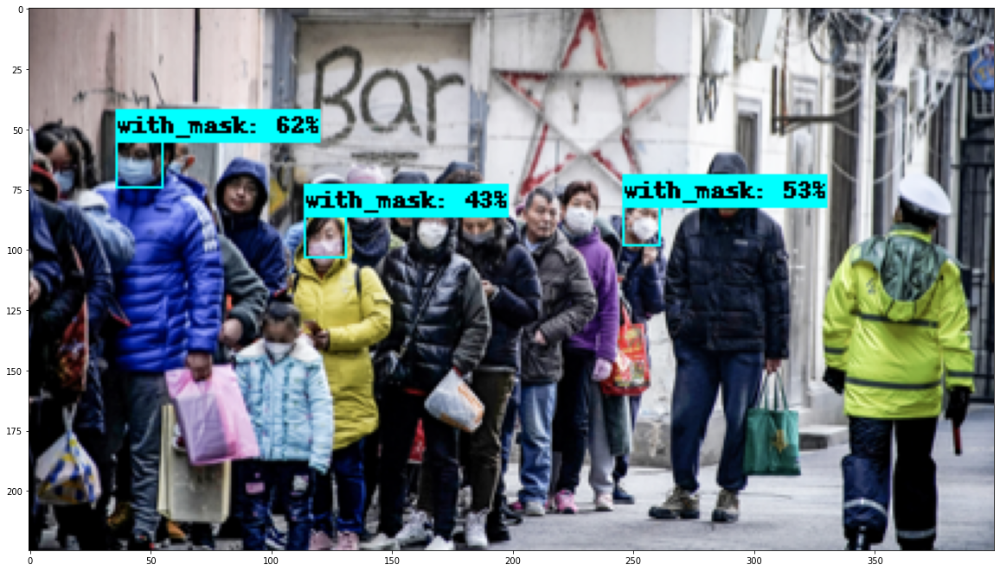

In [16]:
%matplotlib inline
plot_detections(image_np, boxes, classes, scores, category_index, thresh, figsize=(20, 20), image_name=None)

#### Visualize the results by cropping each detected box for better visual evaluation

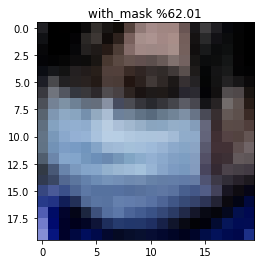

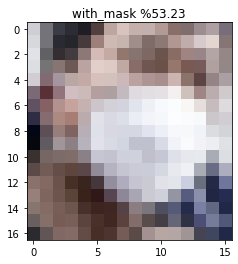

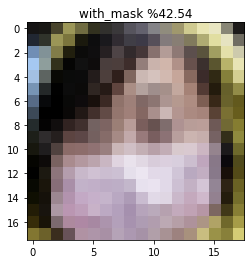

In [17]:
crop_boxes(image_np, boxes, classes, scores, thresh)

#### Choose an image and determine the desired threshold

In [18]:
image_path = '/content/images/maksssksksss139.png'
thresh = 0.35
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()
boxes = detections['detection_boxes'][0].numpy()
classes = (detections['detection_classes'][0].numpy() + label_id_offset).astype(int)
scores = detections['detection_scores'][0].numpy()

#### Visualize the results on the whole image

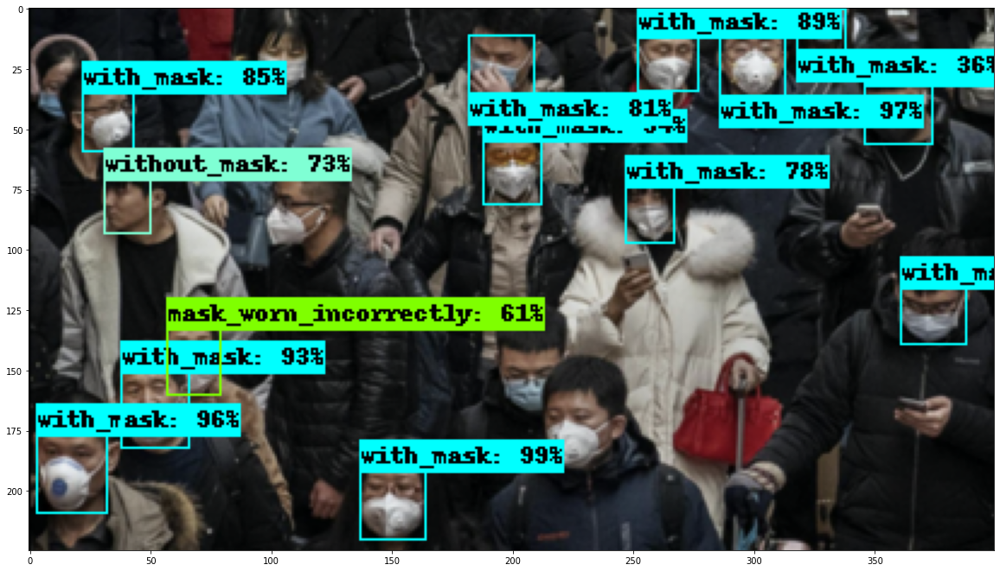

In [19]:
%matplotlib inline
plot_detections(image_np, boxes, classes, scores, category_index, thresh, figsize=(20, 20), image_name=None)

#### Visualize the results by cropping each detected box for better visual evaluation

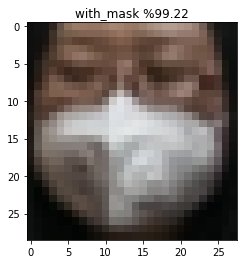

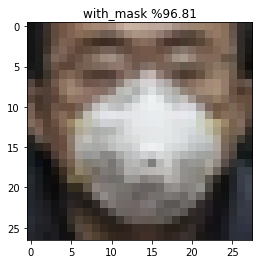

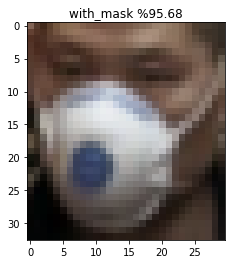

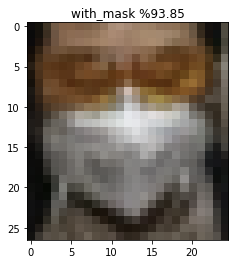

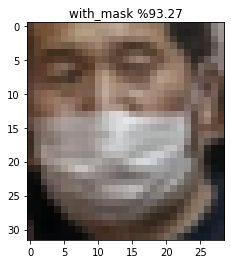

...

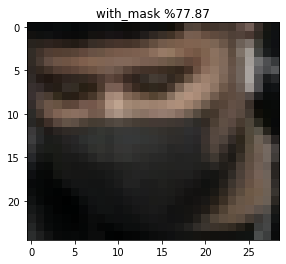

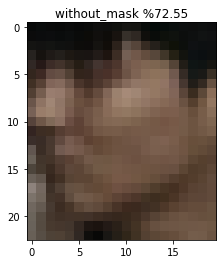

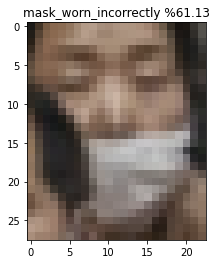

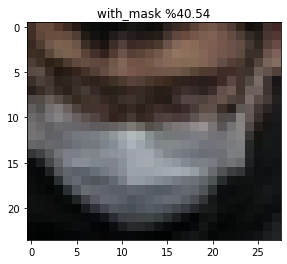

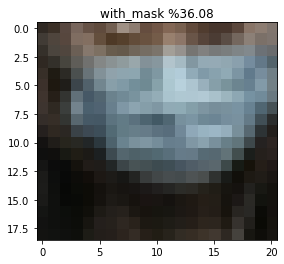

In [20]:
crop_boxes(image_np, boxes, classes, scores, thresh)

#### Choose an image and determine the desired threshold

In [21]:
image_path = '/content/images/maksssksksss156.png'
thresh = 0.35
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()
boxes = detections['detection_boxes'][0].numpy()
classes = (detections['detection_classes'][0].numpy() + label_id_offset).astype(int)
scores = detections['detection_scores'][0].numpy()

#### Visualize the results on the whole image

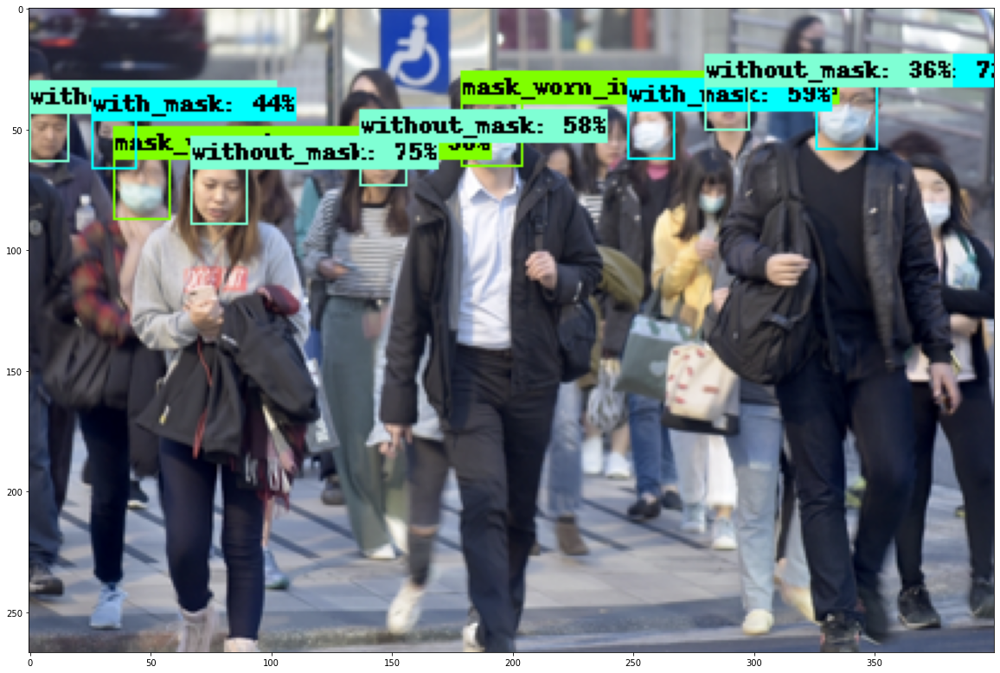

In [22]:
%matplotlib inline
plot_detections(image_np, boxes, classes, scores, category_index, thresh, figsize=(20, 20), image_name=None)

#### Visualize the results by cropping each detected box for better visual evaluation

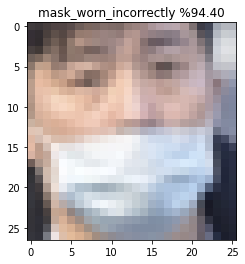

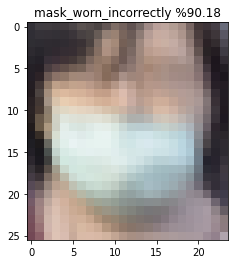

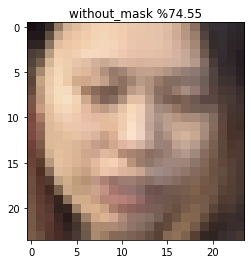

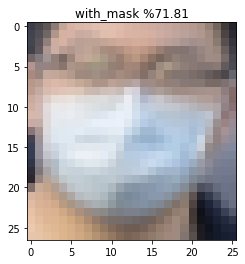

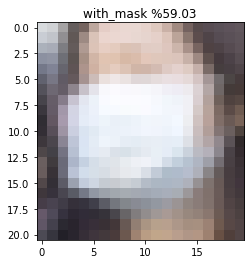

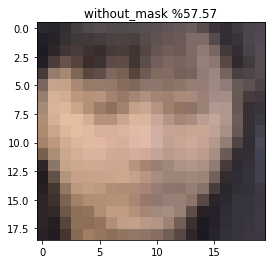

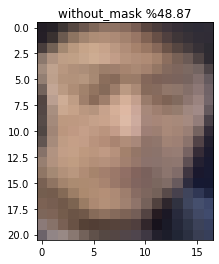

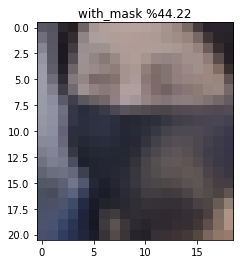

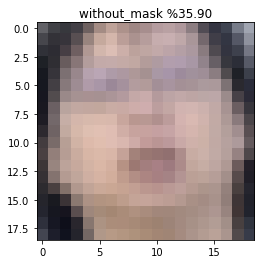

In [23]:
crop_boxes(image_np, boxes, classes, scores, thresh)

#### Choose an image and determine the desired threshold

In [13]:
image_path = '/content/images/maksssksksss672.png'
thresh = 0.35
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()
boxes = detections['detection_boxes'][0].numpy()
classes = (detections['detection_classes'][0].numpy() + label_id_offset).astype(int)
scores = detections['detection_scores'][0].numpy()

#### Visualize the results on the whole image

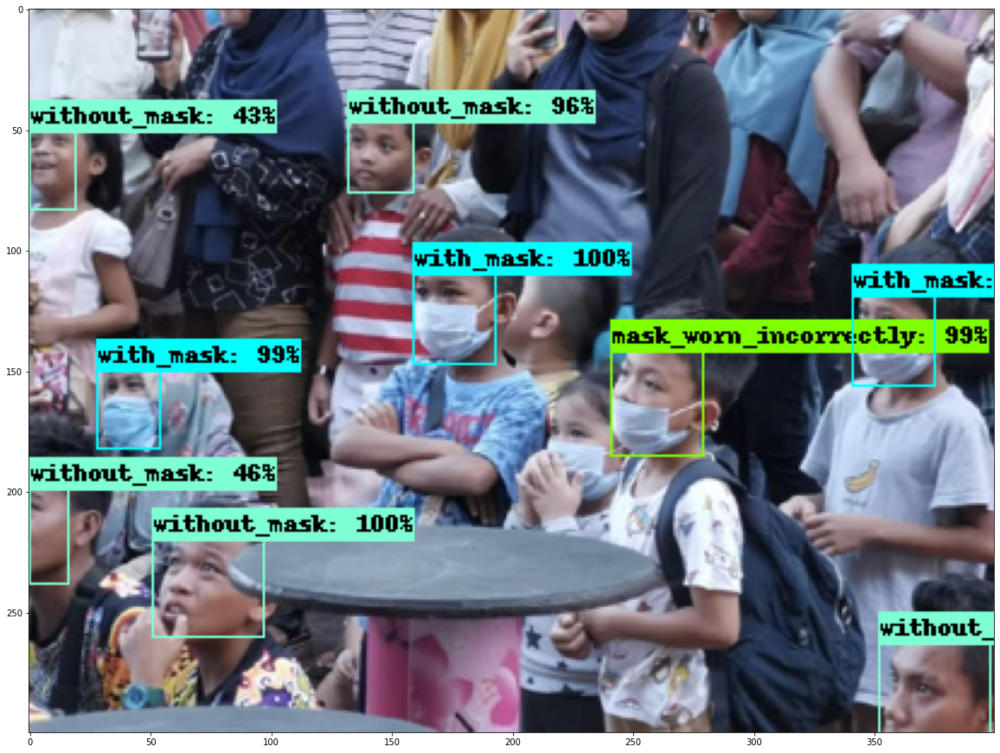

In [14]:
%matplotlib inline
plot_detections(image_np, boxes, classes, scores, category_index, thresh, figsize=(20, 20), image_name=None)

#### Visualize the results by cropping each detected box for better visual evaluation

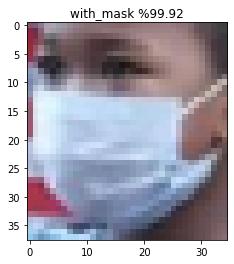

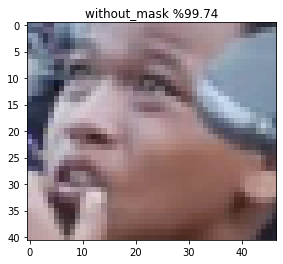

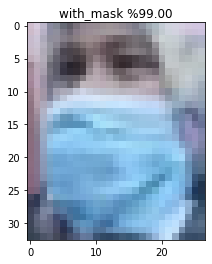

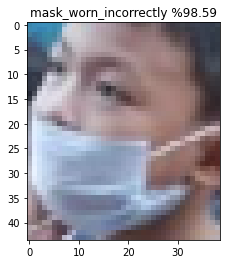

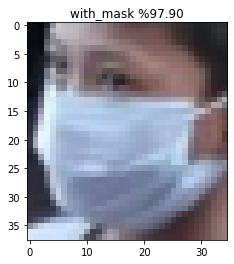

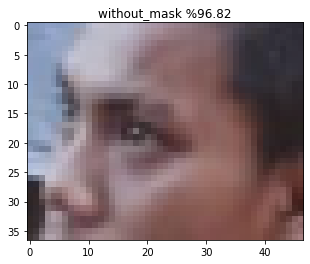

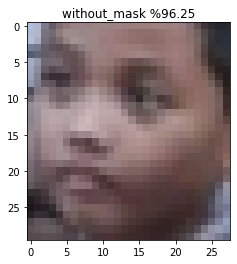

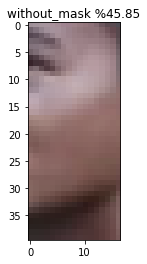

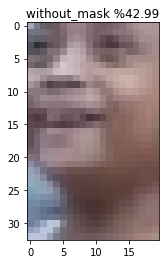

In [15]:
crop_boxes(image_np, boxes, classes, scores, thresh)